In [1]:
import warnings
warnings.filterwarnings("ignore", message=".*Graph is not fully connected.*")

/usr/bin/pip:6: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import load_entry_point
{'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Tue Sep 24 2024', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'i

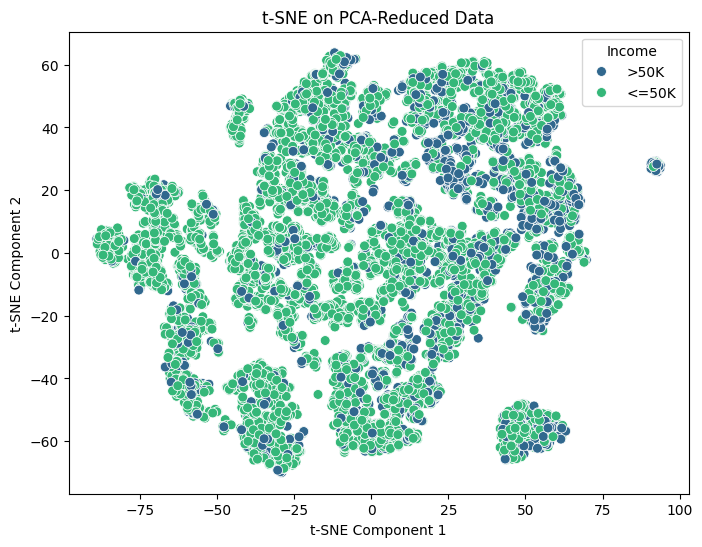

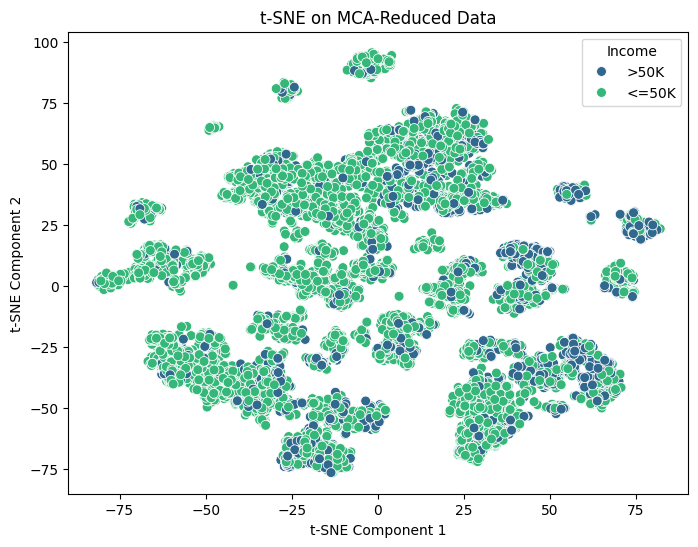

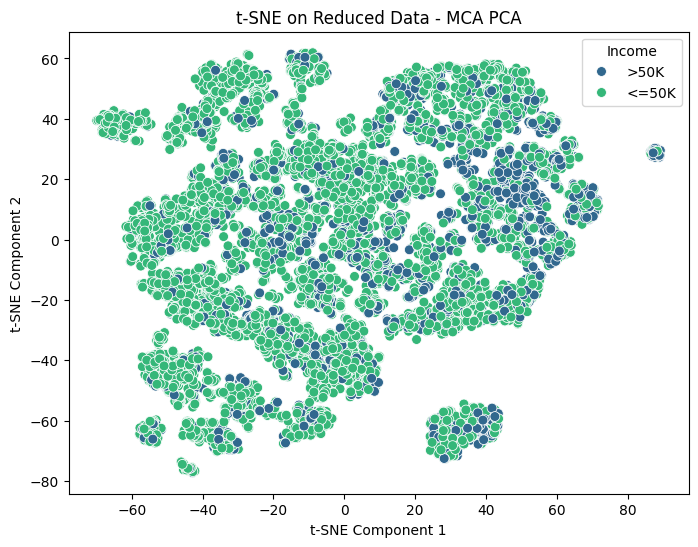

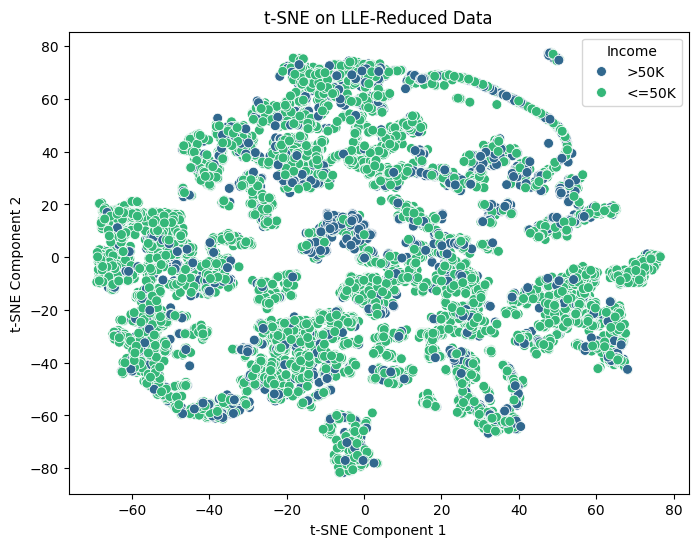

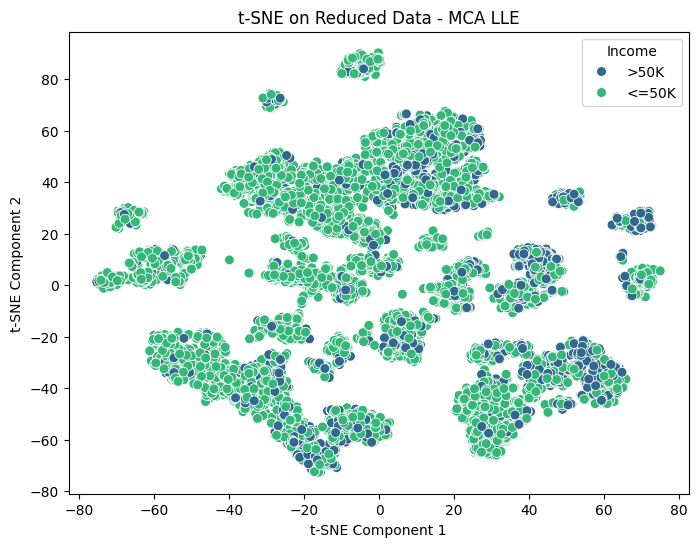

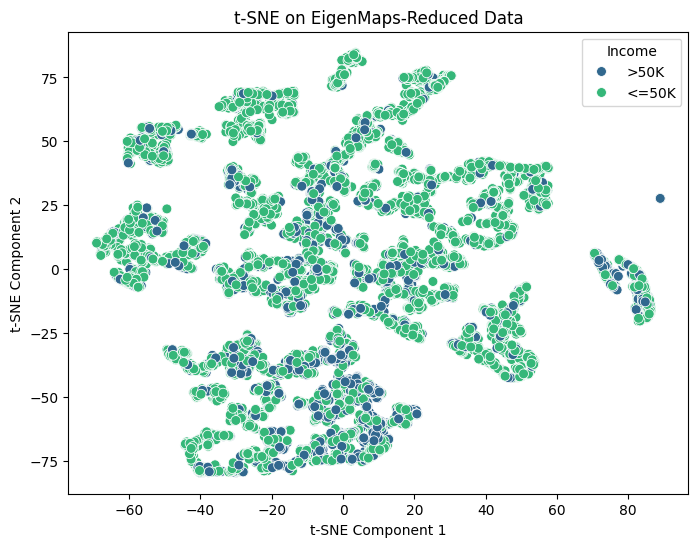

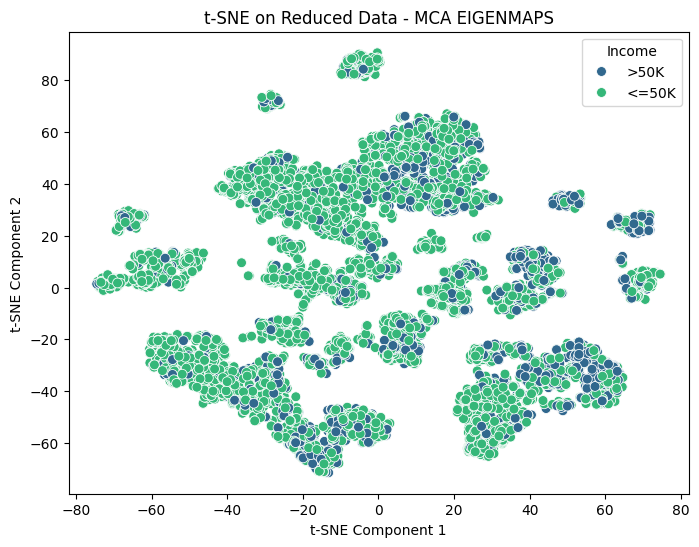

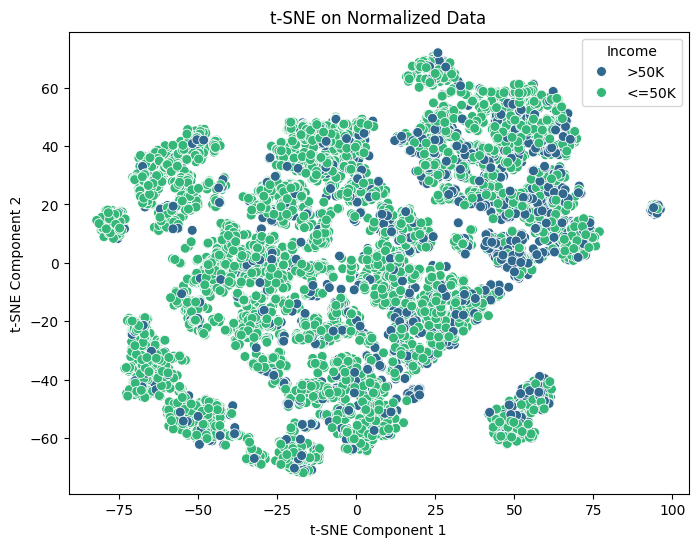

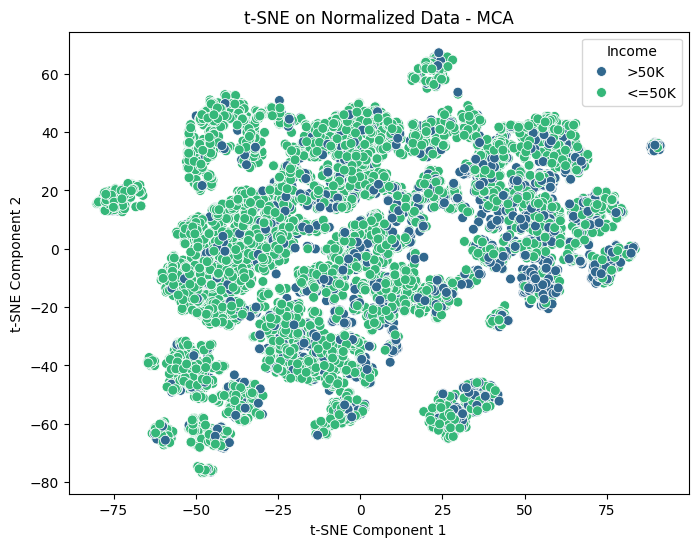

In [2]:
%run -i TSNE.ipynb

# Algorithms

## KMeans

In [3]:
def find_kmeans(X_combined):
    best_kmeans = None
    best_silhouette = -1
    best_i = -1
    kmeans_results = {}
    
    for i in range(2, 30):
        kmeans = KMeans(n_clusters=i, n_init=27, random_state=38)
        kmeans_labels = kmeans.fit_predict(X_combined)
        score = silhouette_score(X_combined, kmeans_labels)
        if score > best_silhouette:
            best_silhouette = score
            best_kmeans = kmeans_labels
            best_i = i
        kmeans_results[i] = {}
        kmeans_results[i]["labels"] = kmeans_labels
        kmeans_results[i]["loss"] = kmeans.inertia_
        kmeans_results[i]["score"] = score
    return kmeans_results, best_i, best_silhouette, best_kmeans

## GMM

In [4]:
from sklearn.mixture import GaussianMixture

def find_gmm(X_combined):
    best_gmm = None
    best_silhouette = -1
    best_i = -1
    gmm_results = {}

    for i in range(2, 30):
        gmm = GaussianMixture(n_components=i, random_state=68)
        gmm_labels = gmm.fit_predict(X_combined)
        score = silhouette_score(X_combined, gmm_labels)
        if score > best_silhouette:
            best_silhouette = score
            best_gmm = gmm_labels
            best_i = i
        gmm_results[i] = {}
        gmm_results[i]["labels"] = gmm_labels
        gmm_results[i]["score"] = score
    return gmm_results, best_i, best_silhouette, best_gmm
        

## DBSCAN

In [5]:
from sklearn.cluster import DBSCAN

def find_dbscan(X_combined):
    dbscan = DBSCAN(eps=0.3, min_samples=5)
    dbscan_labels = dbscan.fit_predict(X_combined)
    dbscan_silhouette = silhouette_score(X_combined, dbscan_labels)
    return dbscan_labels, dbscan_silhouette


## HDBSCAN

In [6]:
import hdbscan

def find_hdbscan(X_combined):
    hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=5)
    hdbscan_labels = hdbscan_model.fit_predict(X_combined)
    hdbscan_silhouette = silhouette_score(X_combined, hdbscan_labels)
    return hdbscan_labels, hdbscan_silhouette
    

## Spectral Clustering

In [7]:
from sklearn.cluster import SpectralClustering

def find_spec(X_combined):
    best_spec = None
    best_silhouette = -1
    best_i = -1
    spec_results = {}

    for i in range(2, 30):
        spec = SpectralClustering(n_clusters=i, affinity='nearest_neighbors', random_state=15)
        spectral_labels = spec.fit_predict(X_combined)
        score = silhouette_score(X_combined, spectral_labels)
        if score > best_silhouette:
            best_silhouette = score
            best_spec = spectral_labels
            best_i = i
        spec_results[i] = {}
        spec_results[i]["labels"] = spectral_labels
        spec_results[i]["score"] = score
    return spec_results, best_i, best_silhouette, best_spec


## Fuzzy-CMeans

In [8]:
import skfuzzy as fuzz

def find_fuzzy(X_combined):
    best_fuzzy = None
    best_silhouette = -1
    best_i = -1
    fuzzy_results = {}

    for i in range(2, 30):
        cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
        X_combined.T, c=i, m=2, error=0.005, maxiter=1000, init=None
        )
        fuzzy_labels = u.argmax(axis=0)
        score = silhouette_score(X_combined, fuzzy_labels)
        if score > best_silhouette:
            best_silhouette = score
            best_fuzzy = fuzzy_labels
            best_i = i
        fuzzy_results[i] = {}
        fuzzy_results[i]["labels"] = fuzzy_labels
        fuzzy_results[i]["score"] = score
    return fuzzy_results, best_i, best_silhouette, best_fuzzy


## Plot

In [9]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

def plot_results_on_tsne(X_tsne, best_kmeans, best_gmm, dbscan_labels, hdbscan_labels, best_spec, best_fuzzy):
    # Create a DataFrame for visualization
    tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
    tsne_df['KMeans Cluster'] = best_kmeans
    tsne_df['GMM Cluster'] = best_gmm
    tsne_df['DBSCAN Cluster'] = dbscan_labels
    tsne_df['HDBSCAN Cluster'] = hdbscan_labels
    tsne_df['Spectral Cluster'] = best_spec
    tsne_df['Fuzzy-CMeans Cluster'] = best_fuzzy

    # Plot K-Means clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='KMeans Cluster', palette='Set1', alpha=0.7)
    plt.title('K-Means Clustering on Combined PCA and MCA Components')
    plt.show()

    # Plot GMM clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='GMM Cluster', palette='Set2', alpha=0.7)
    plt.title('GMM Clustering on Combined PCA and MCA Components')
    plt.show()

    # Plot DBSCAN clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='DBSCAN Cluster', palette='Set3', alpha=0.7)
    plt.title('DBSCAN Clustering on Combined PCA and MCA Components')
    plt.show()

    # Plot HDBSCAN clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='HDBSCAN Cluster', palette='Set3', alpha=0.7)
    plt.title('HDBSCAN Clustering on Combined PCA and MCA Components')
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Spectral Cluster', palette='Set2', alpha=0.7)
    plt.title("Spectral Clustering on Combined PCA and MCA Components")
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Fuzzy-CMeans Cluster', palette='Set2', alpha=0.7)
    plt.title("Fuzzy Clustering on Combined PCA and MCA Components")
    plt.show()


# PCA Data

In [10]:
kmeans_results_pca, best_i, kmeans_pca_score, best_kmeans = find_kmeans(X_combined_pca)
print(f"{best_i} has the best K-Means Silhouette Score: {kmeans_pca_score:.2f}")

gmm_results_pca, best_i, gmm_pca_score, best_gmm = find_gmm(X_combined_pca)
print(f"{best_i} has the best GMM Silhouette Score: {gmm_pca_score:.2f}")

dbscan_labels_pca, dbscan_silhouette_pca = find_dbscan(X_combined_pca)
print(f"DBSCAN Silhouette Score: {dbscan_silhouette_pca:.2f}")

hdbscan_labels_pca, hdbscan_silhouette_pca = find_hdbscan(X_combined_pca)
print(f"HDBSCAN Silhouette Score: {hdbscan_silhouette_pca:.2f}")

spec_results_pca, best_i, spec_pca_score, best_spec = find_spec(X_combined_pca)
print(f"{best_i} has the best Spectral Silhouette Score: {spec_pca_score:.2f}")

fuzzy_results_pca, best_i, fuzzy_pca_score, best_fuzzy = find_fuzzy(X_combined_pca)
print(f"{best_i} has the best CMeans Score: {fuzzy_pca_score:.2f}")

3 has the best K-Means Silhouette Score: 0.54
2 has the best GMM Silhouette Score: 0.22
DBSCAN Silhouette Score: -0.51
HDBSCAN Silhouette Score: 0.76
2 has the best Spectral Silhouette Score: 0.76
3 has the best CMeans Score: 0.17


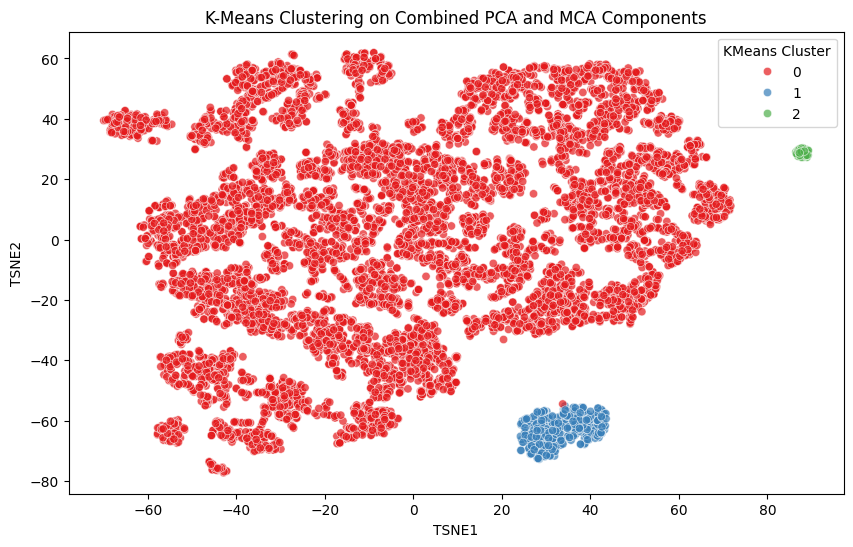

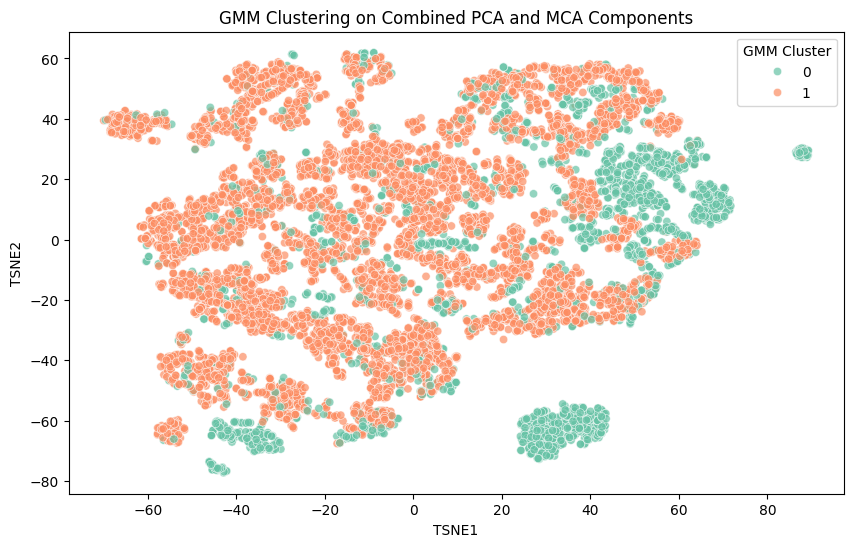

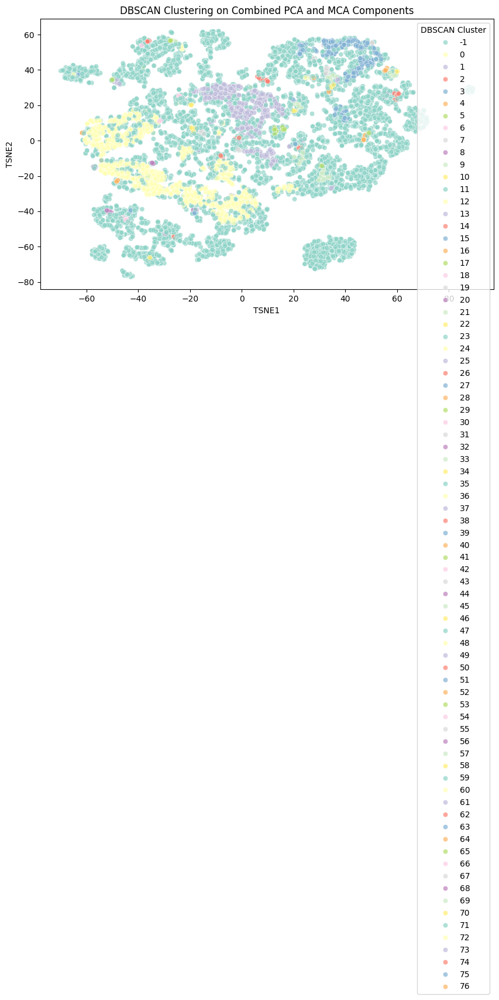

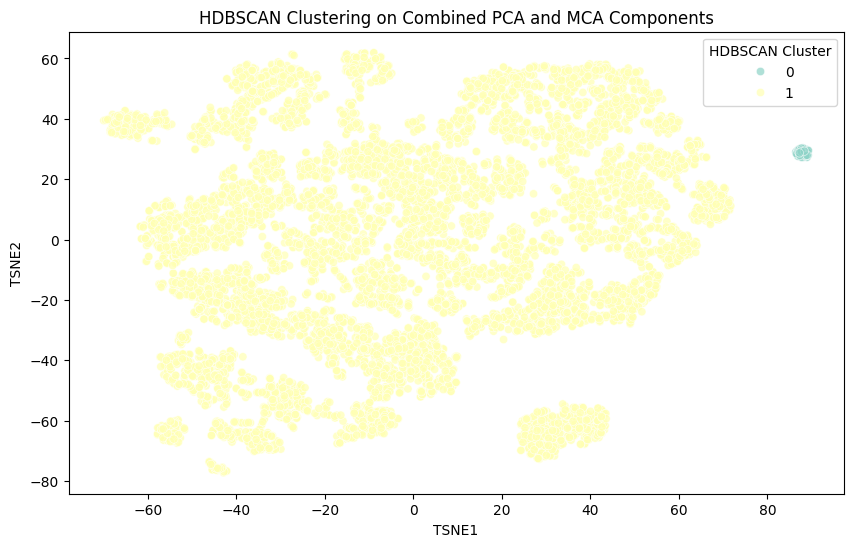

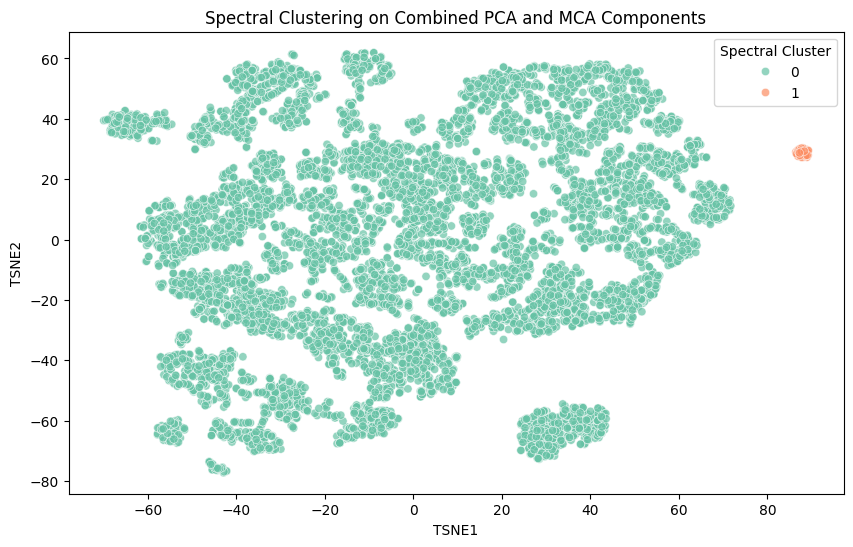

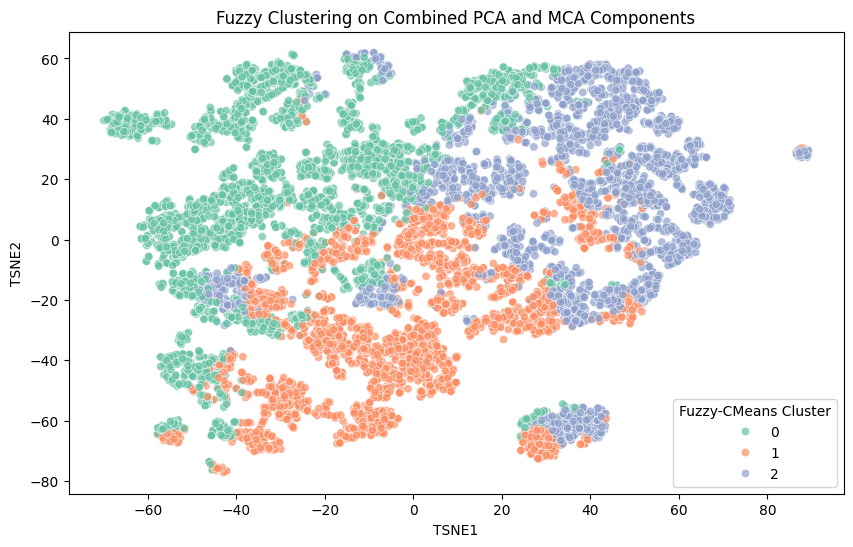

In [11]:
plot_results_on_tsne(X_tsne_pca, best_kmeans, best_gmm, dbscan_labels_pca, hdbscan_labels_pca, best_spec, best_fuzzy)

# LLE Data

In [12]:
kmeans_results_lle, best_i, kmeans_lle_score, best_kmeans = find_kmeans(X_combined_lle)
print(f"{best_i} has the best K-Means Silhouette Score: {kmeans_lle_score:.2f}")

gmm_results_lle, best_i, gmm_lle_score, best_gmm = find_gmm(X_combined_lle)
print(f"{best_i} has the best GMM Silhouette Score: {gmm_lle_score:.2f}")

dbscan_labels_lle, dbscan_silhouette_lle = find_dbscan(X_combined_lle)
print(f"DBSCAN Silhouette Score: {dbscan_silhouette_lle:.2f}")

hdbscan_labels_lle, hdbscan_silhouette_lle = find_hdbscan(X_combined_lle)
print(f"HDBSCAN Silhouette Score: {hdbscan_silhouette_lle:.2f}")

spec_results_lle, best_i, spec_lle_score, best_spec = find_spec(X_combined_lle)
print(f"{best_i} has the best Spectral Silhouette Score: {spec_lle_score:.2f}")

fuzzy_results_lle, best_i, fuzzy_lle_score, best_fuzzy = find_fuzzy(X_combined_pca)
print(f"{best_i} has the best CMeans Score: {fuzzy_lle_score:.2f}")

10 has the best K-Means Silhouette Score: 0.32
2 has the best GMM Silhouette Score: 0.24
DBSCAN Silhouette Score: 0.24
HDBSCAN Silhouette Score: 0.00
3 has the best Spectral Silhouette Score: 0.39
3 has the best CMeans Score: 0.17


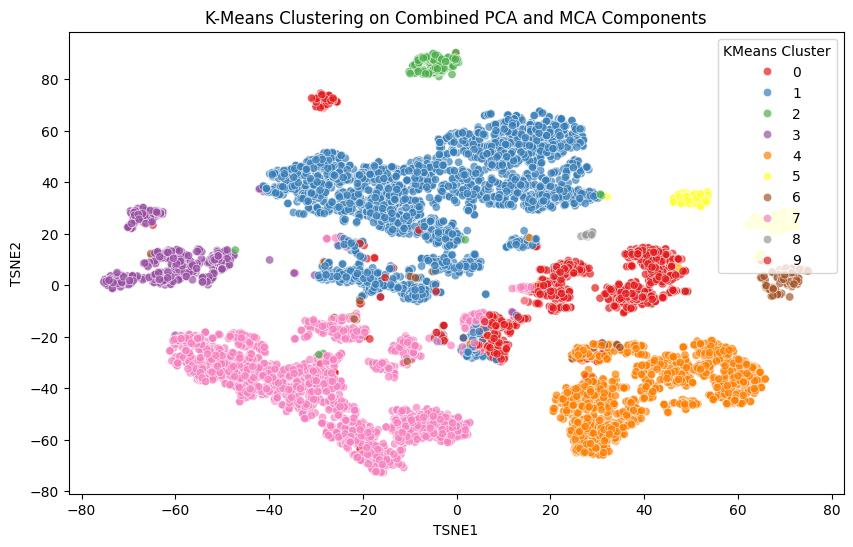

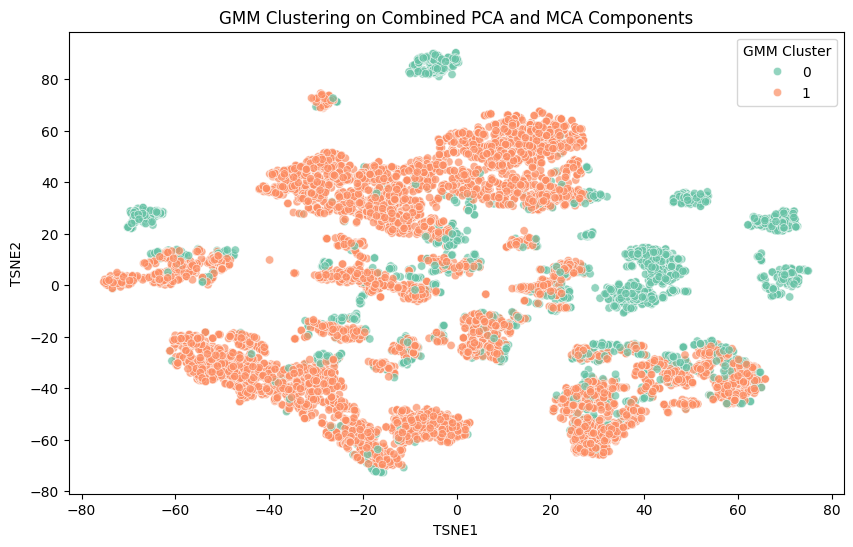

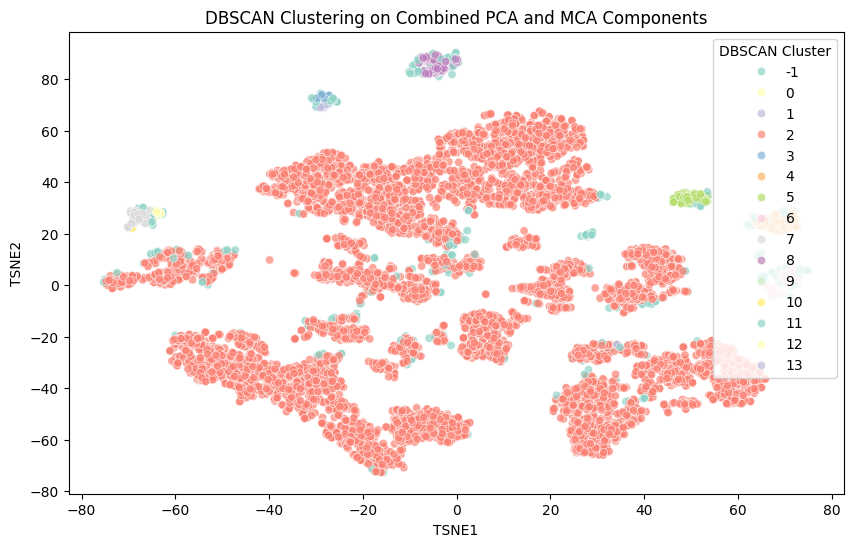

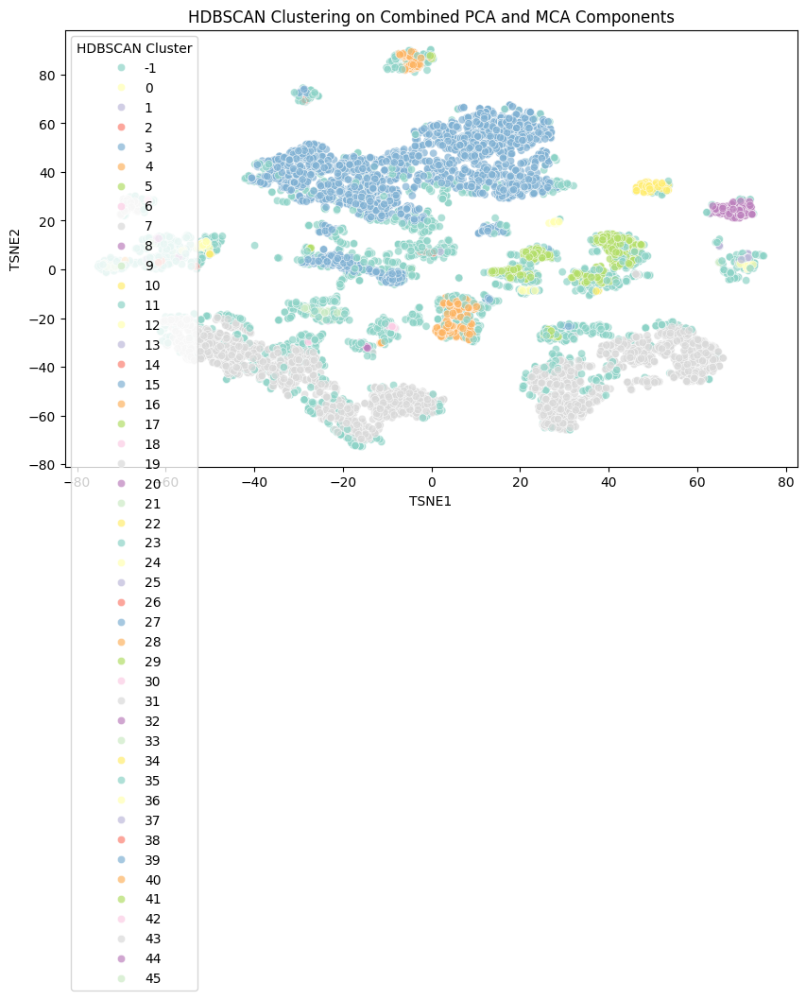

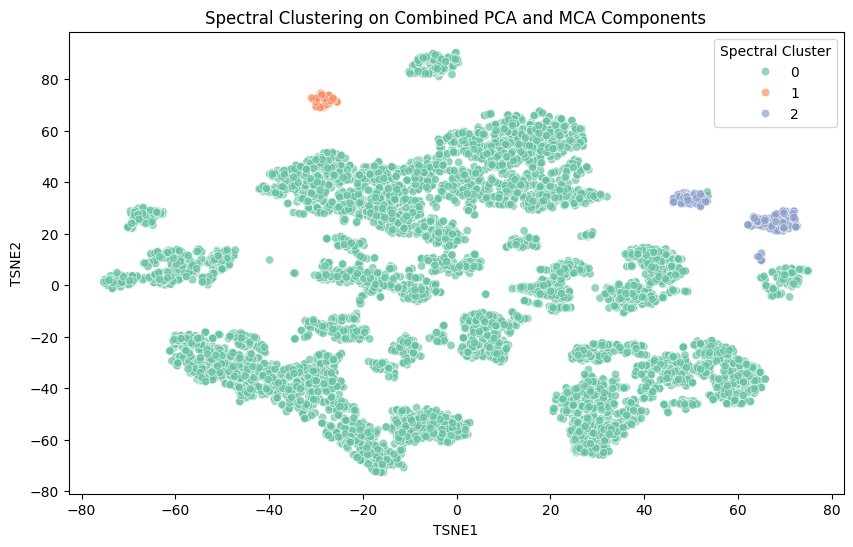

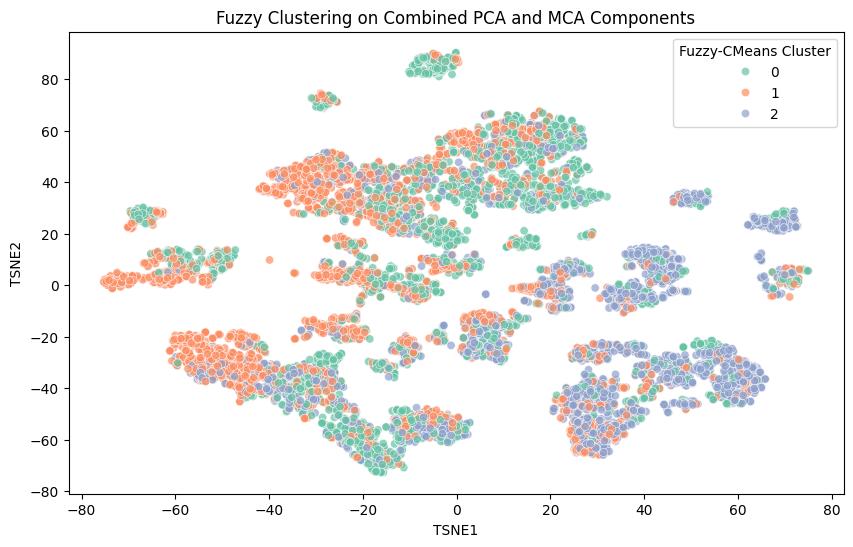

In [13]:
plot_results_on_tsne(X_tsne_lle, best_kmeans, best_gmm, dbscan_labels_lle, hdbscan_labels_lle, best_spec, best_fuzzy)

# EigenMap Data

In [14]:
kmeans_results_eigen, best_i, kmeans_eigen_score, best_kmeans = find_kmeans(X_combined_eigen)
print(f"{best_i} has the best K-Means Silhouette Score: {kmeans_eigen_score:.2f}")

gmm_results_eigen, best_i, gmm_eigen_score, best_gmm = find_gmm(X_combined_eigen)
print(f"{best_i} has the best GMM Silhouette Score: {gmm_eigen_score:.2f}")

dbscan_labels_eigen, dbscan_silhouette_eigen = find_dbscan(X_combined_eigen)
print(f"DBSCAN Silhouette Score: {dbscan_silhouette_eigen:.2f}")

hdbscan_labels_eigen, hdbscan_silhouette_eigen = find_hdbscan(X_combined_eigen)
print(f"HDBSCAN Silhouette Score: {hdbscan_silhouette_eigen:.2f}")

spec_results_eigen, best_i, spec_eigen_score, best_spec = find_spec(X_combined_eigen)
print(f"{best_i} has the best Spectral Silhouette Score: {spec_eigen_score:.2f}")

fuzzy_results_eigen, best_i, fuzzy_eigen_score, best_fuzzy = find_fuzzy(X_combined_pca)
print(f"{best_i} has the best CMeans Score: {fuzzy_eigen_score:.2f}")

10 has the best K-Means Silhouette Score: 0.32
2 has the best GMM Silhouette Score: 0.26
DBSCAN Silhouette Score: 0.24
HDBSCAN Silhouette Score: -0.19
3 has the best Spectral Silhouette Score: 0.39
3 has the best CMeans Score: 0.17


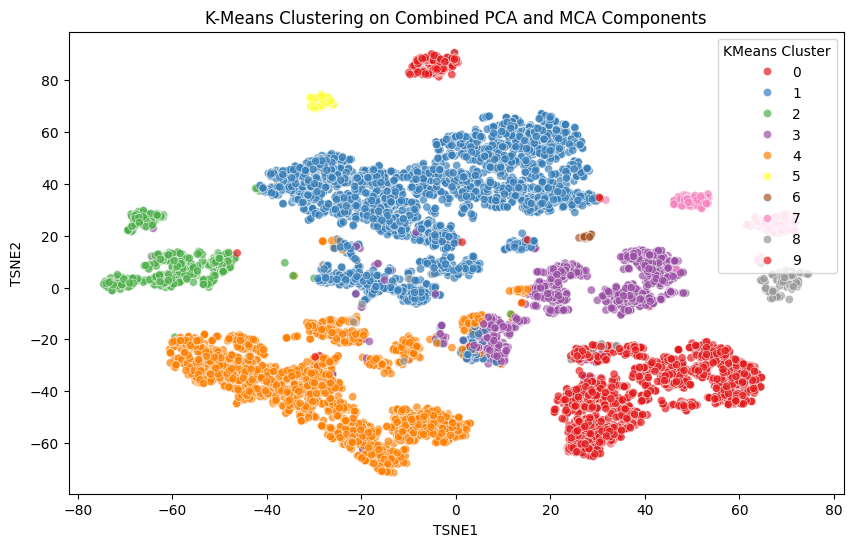

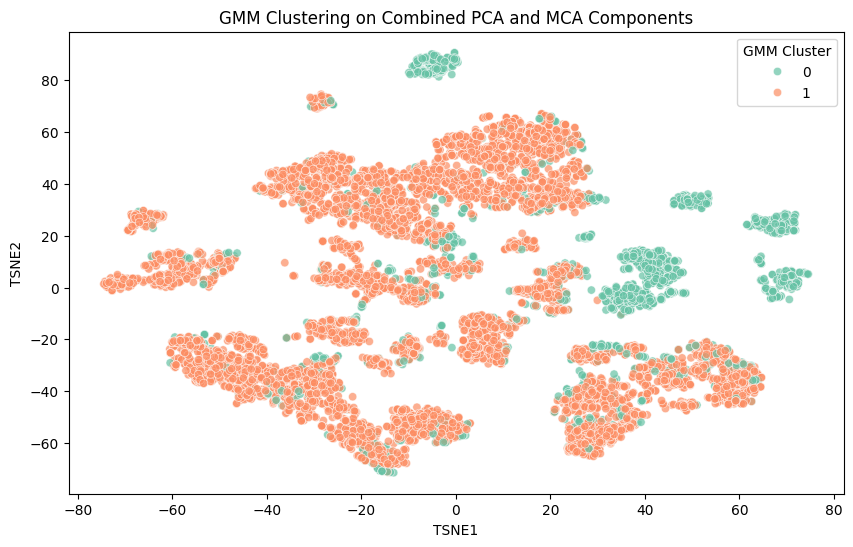

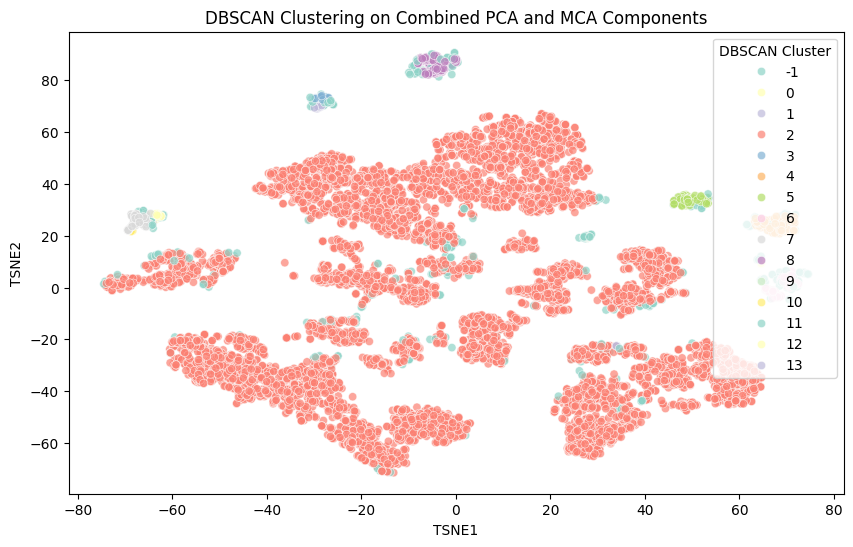

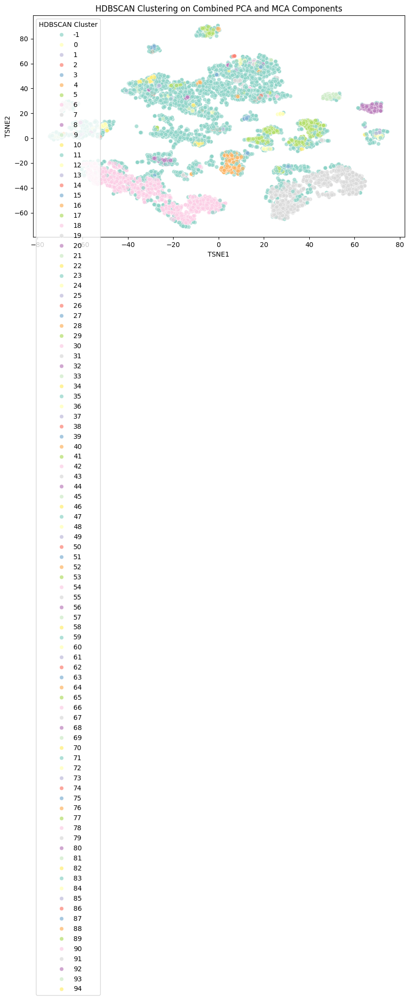

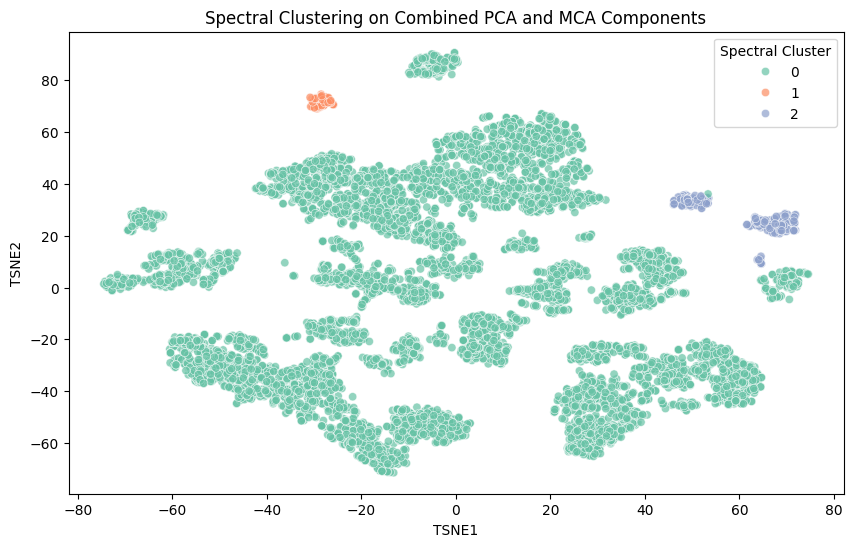

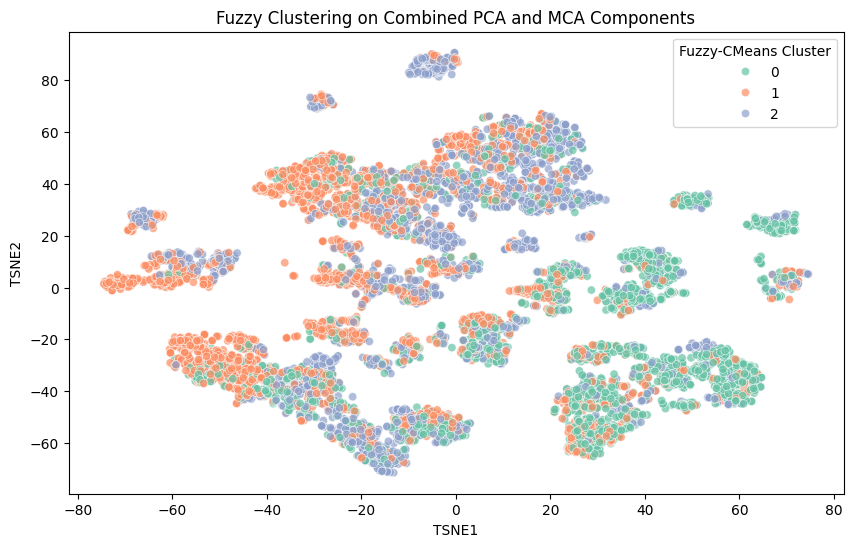

In [15]:
plot_results_on_tsne(X_tsne_eigen, best_kmeans, best_gmm, dbscan_labels_eigen, hdbscan_labels_eigen, best_spec, best_fuzzy)

# Normalized Data

In [16]:
kmeans_results, best_i, kmeans_score, best_kmeans = find_kmeans(X_combined)
print(f"{best_i} has the best K-Means Silhouette Score: {kmeans_score:.2f}")

gmm_results, best_i, gmm_score, best_gmm = find_gmm(X_combined)
print(f"{best_i} has the best GMM Silhouette Score: {gmm_score:.2f}")

dbscan_labels, dbscan_silhouette = find_dbscan(X_combined)
print(f"DBSCAN Silhouette Score: {dbscan_silhouette:.2f}")

hdbscan_labels, hdbscan_silhouette = find_hdbscan(X_combined)
print(f"HDBSCAN Silhouette Score: {hdbscan_silhouette:.2f}")

spec_results, best_i, spec_score, best_spec = find_spec(X_combined)
print(f"{best_i} has the best Spectral Silhouette Score: {spec_score:.2f}")

fuzzy_results, best_i, fuzzy_score, best_fuzzy = find_fuzzy(X_combined_pca)
print(f"{best_i} has the best CMeans Score: {fuzzy_score:.2f}")

3 has the best K-Means Silhouette Score: 0.52
2 has the best GMM Silhouette Score: 0.27
DBSCAN Silhouette Score: -0.50
HDBSCAN Silhouette Score: 0.77
2 has the best Spectral Silhouette Score: 0.77
3 has the best CMeans Score: 0.17


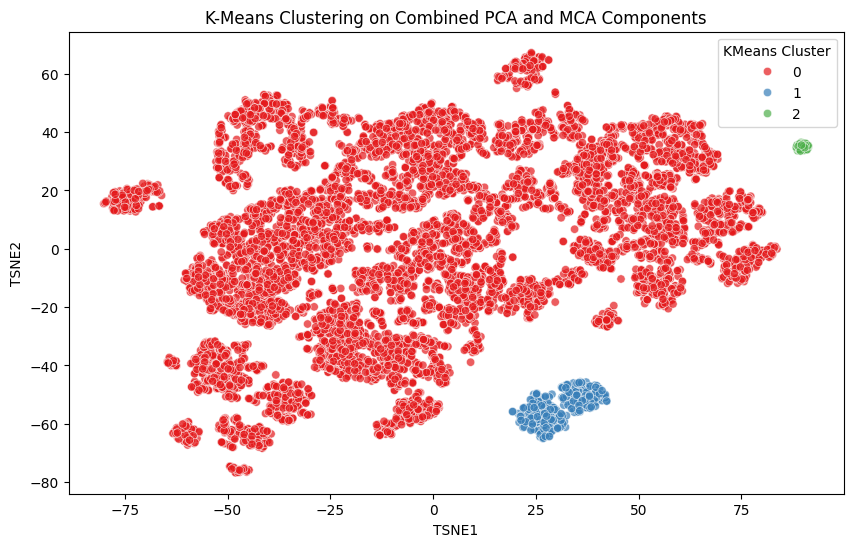

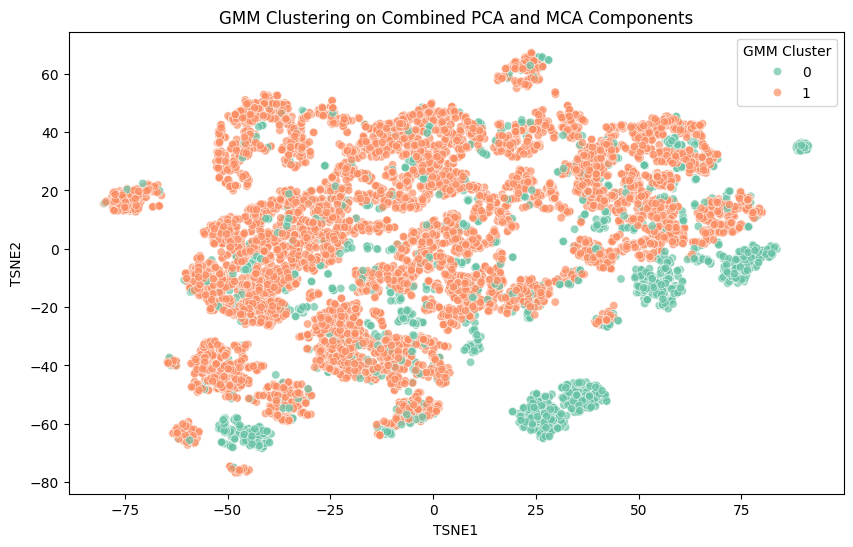

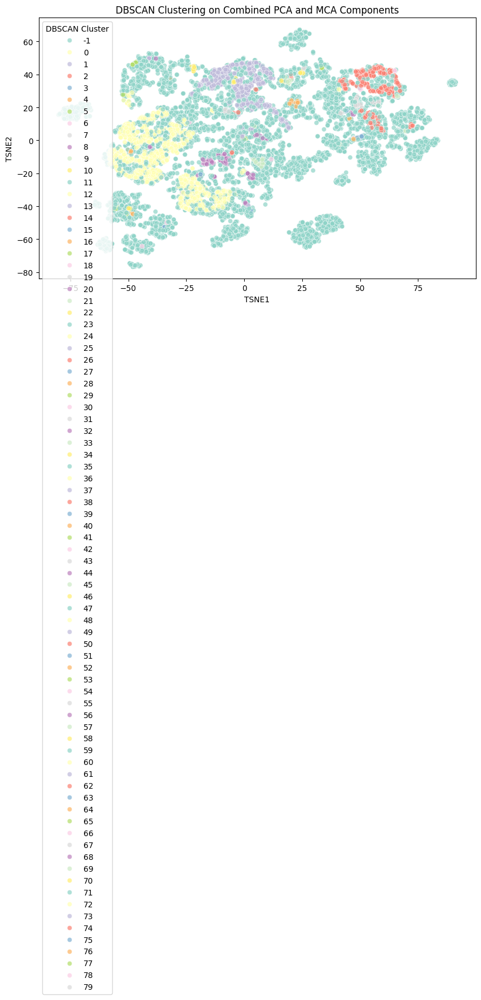

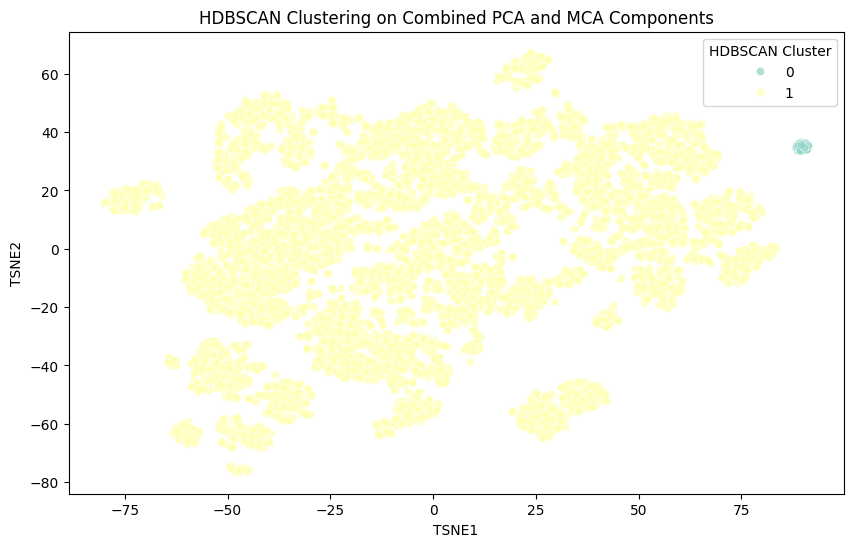

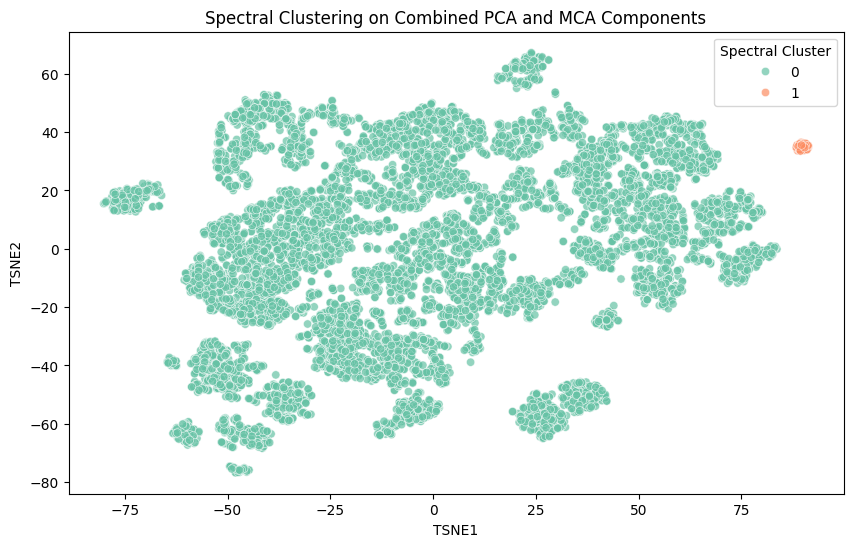

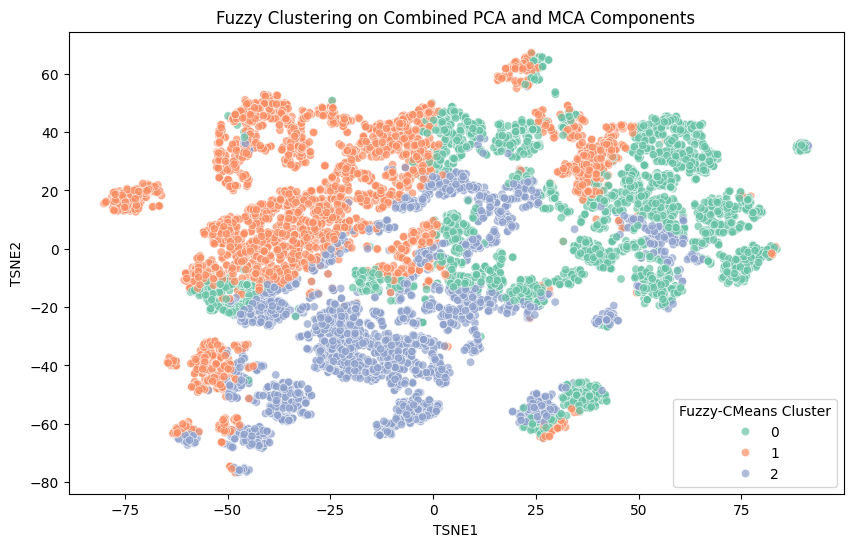

In [17]:
plot_results_on_tsne(X_tsne_normalized, best_kmeans, best_gmm, dbscan_labels, hdbscan_labels, best_spec, best_fuzzy)

# Plots

## KMeans Losses Elbow

In [18]:
def plot_kmeans_losses(results, norm):
    sorted_keys = sorted(results.keys())
    losses = [results[k]["loss"] for k in sorted_keys]

    plt.plot(range(2, len(losses)+2), losses, marker='o')
    plt.title(f'KMeans Losses - {norm}')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Loss / Inertia')
    plt.grid(True)
    plt.show()

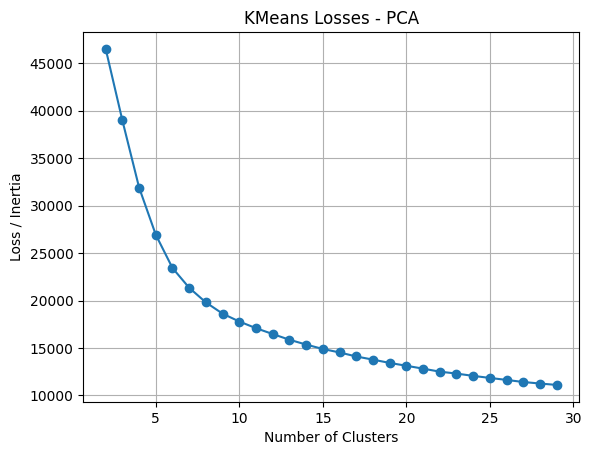

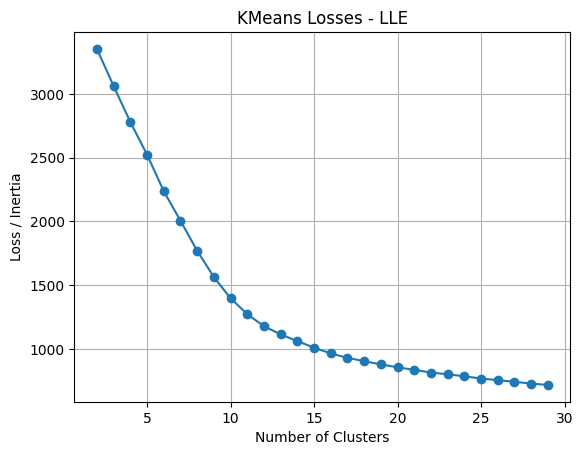

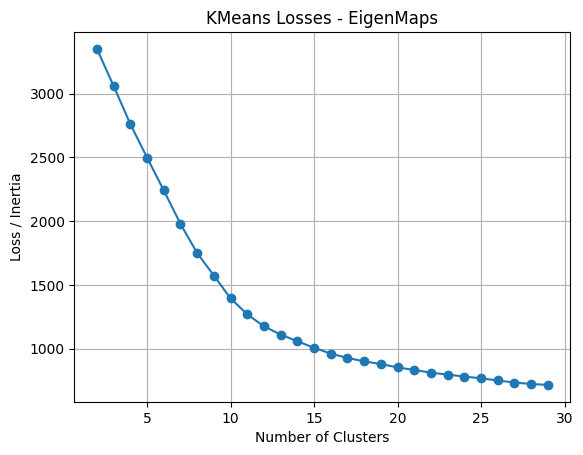

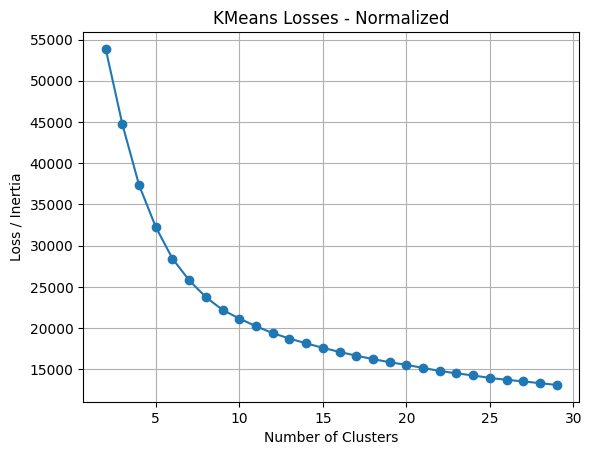

In [19]:
plot_kmeans_losses(kmeans_results_pca, "PCA")
plot_kmeans_losses(kmeans_results_lle, "LLE")
plot_kmeans_losses(kmeans_results_eigen, "EigenMaps")
plot_kmeans_losses(kmeans_results, "Normalized")


## Sillhouette per Number of Clusters

In [20]:
def plot_silhouette(results, title):
    sorted_keys = sorted(kmeans_results_pca.keys())
    sil_scores = [results[k]["score"] for k in sorted_keys]
    plt.plot(range(2, len(sil_scores)+2), sil_scores, marker='o')
    plt.title(f'Silhouette Scores - {title}')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    plt.show()

### PCA

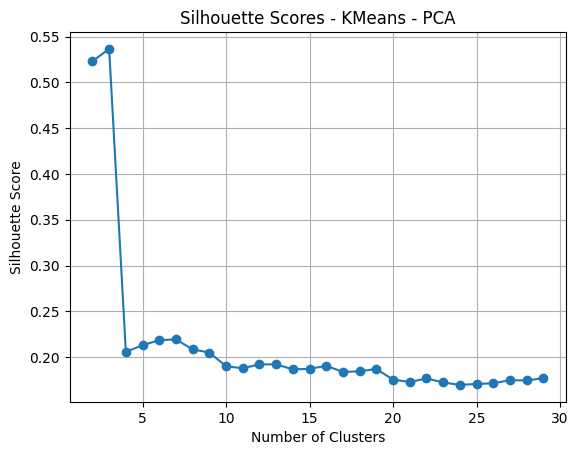

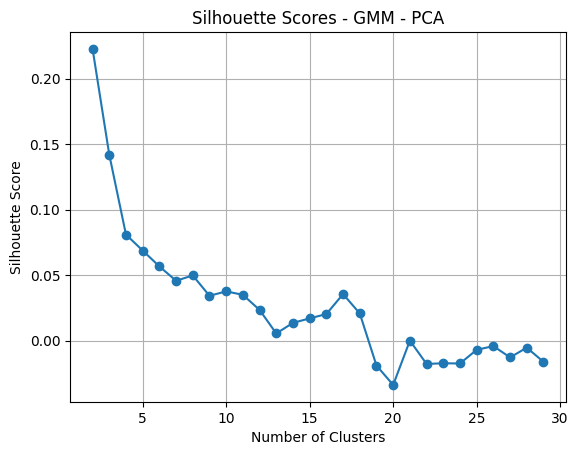

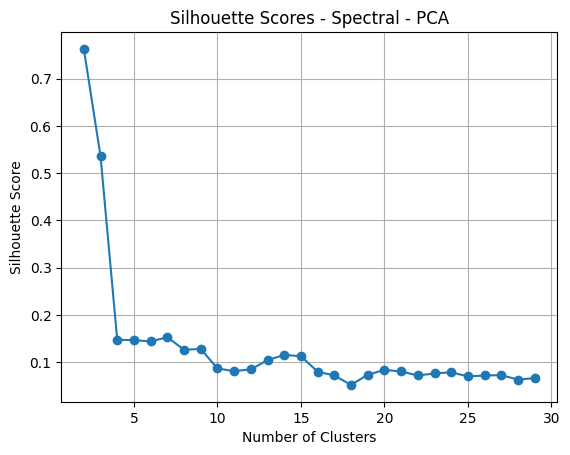

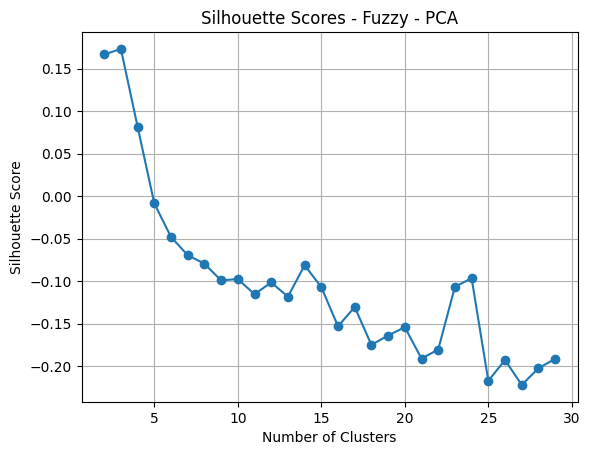

In [21]:
plot_silhouette(kmeans_results_pca, "KMeans - PCA")
plot_silhouette(gmm_results_pca, "GMM - PCA")
plot_silhouette(spec_results_pca, "Spectral - PCA")
plot_silhouette(fuzzy_results_pca, "Fuzzy - PCA")

### LLE

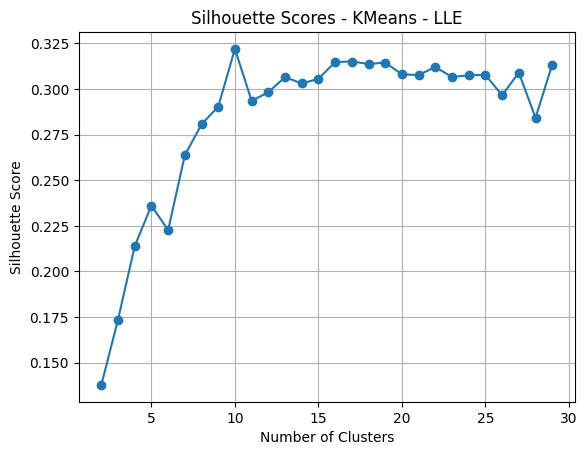

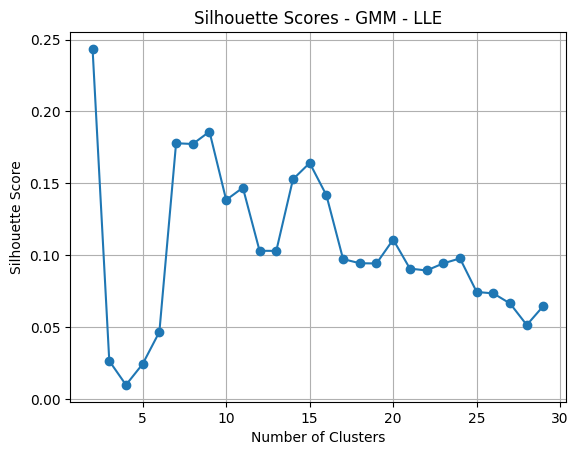

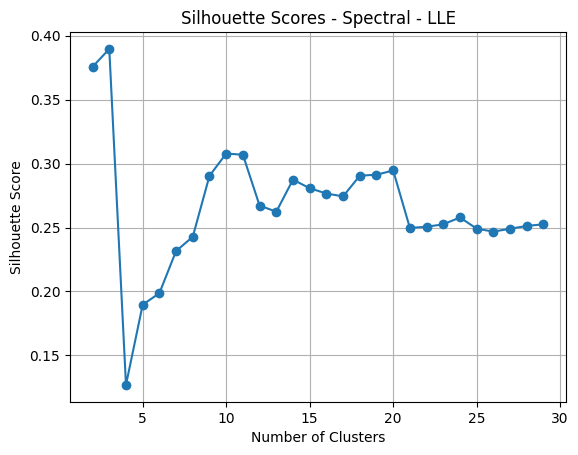

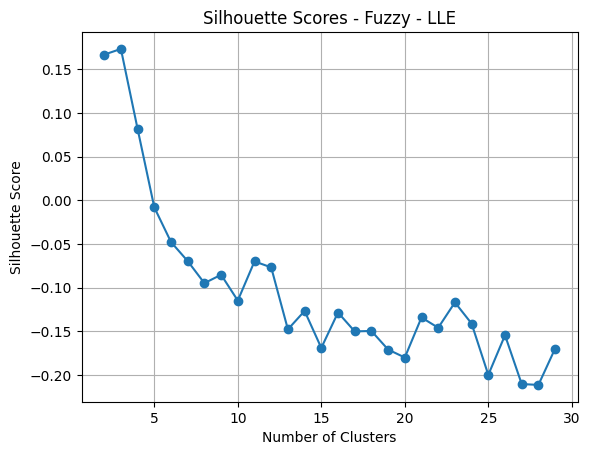

In [22]:
plot_silhouette(kmeans_results_lle, "KMeans - LLE")
plot_silhouette(gmm_results_lle, "GMM - LLE")
plot_silhouette(spec_results_lle, "Spectral - LLE")
plot_silhouette(fuzzy_results_lle, "Fuzzy - LLE")

### EigenMaps

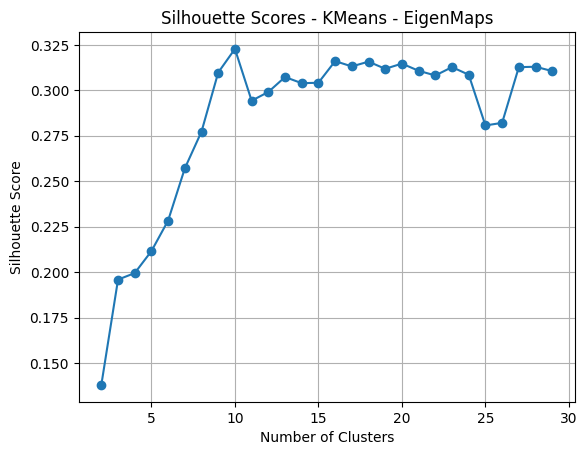

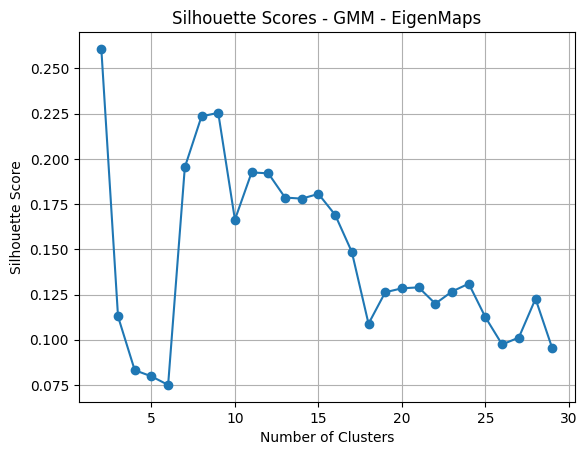

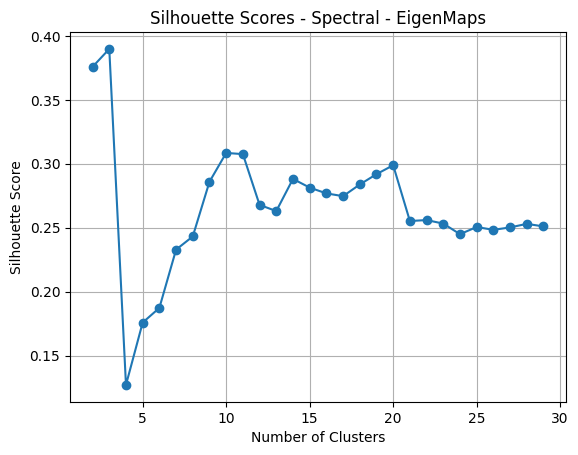

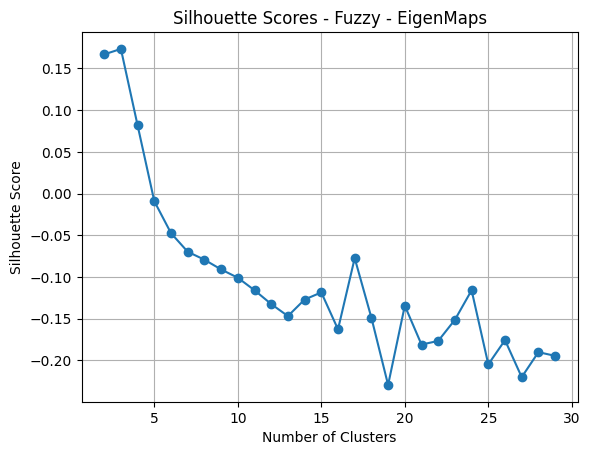

In [23]:
plot_silhouette(kmeans_results_eigen, "KMeans - EigenMaps")
plot_silhouette(gmm_results_eigen, "GMM - EigenMaps")
plot_silhouette(spec_results_eigen, "Spectral - EigenMaps")
plot_silhouette(fuzzy_results_eigen, "Fuzzy - EigenMaps")

### Normalized

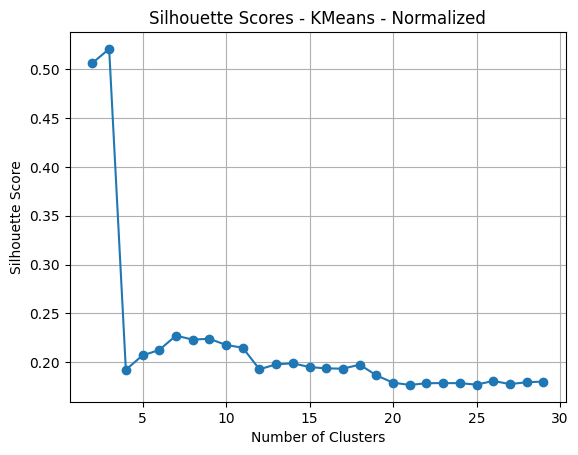

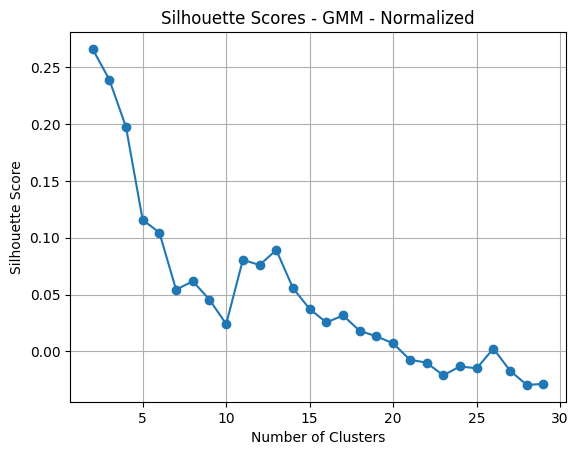

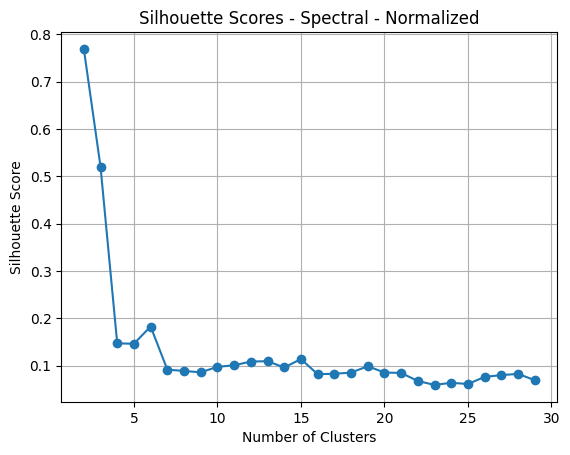

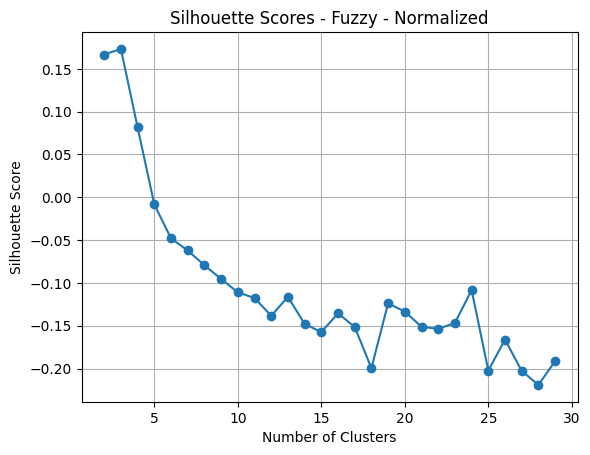

In [24]:
plot_silhouette(kmeans_results, "KMeans - Normalized")
plot_silhouette(gmm_results, "GMM - Normalized")
plot_silhouette(spec_results, "Spectral - Normalized")
plot_silhouette(fuzzy_results, "Fuzzy - Normalized")

## Comparing Different Algorithms for Each Reduction Method

In [77]:
def plot_scores_per_dim_reduction(results):
    n_methods = len(results)
    ncols = 2
    nrows = math.ceil(n_methods / ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 6, nrows * 5))
    axes = axes.flatten()

    palette = sns.color_palette("tab10") + sns.color_palette("pastel") + sns.color_palette("Set2")

    for i, (dim_method, alg_scores) in enumerate(results.items()):
        scores = {alg: score for alg, score in alg_scores.items() if score is not None}
        sorted_algs = sorted(scores, key=scores.get, reverse=True)
        sorted_scores = [scores[alg] for alg in sorted_algs]

        ax = axes[i]
        colors = [palette[j % len(palette)] for j in range(len(sorted_algs))]
        ax.bar(sorted_algs, sorted_scores, color=colors, width=0.3)
        ax.set_title(f"{dim_method} - Silhouette Scores")
        ax.set_ylabel("Score")
        ax.set_xlabel("Clustering Algorithm")
        ax.tick_params(axis='x', rotation=45)
        ax.grid(axis='y')

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


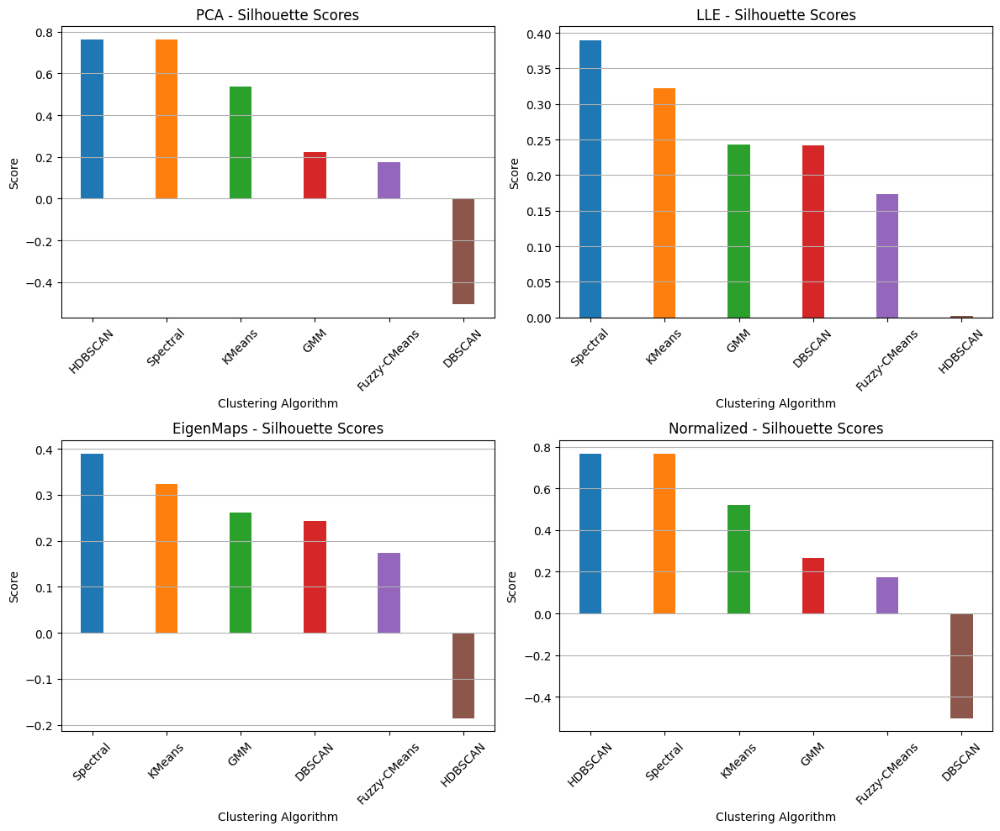

In [78]:
scores = {
    "PCA": {
        "KMeans": kmeans_pca_score, "GMM": gmm_pca_score, "DBSCAN": dbscan_silhouette_pca, "HDBSCAN": hdbscan_silhouette_pca,
        "Spectral": spec_pca_score, "Fuzzy-CMeans": fuzzy_pca_score
    },
    "LLE": {
        "KMeans": kmeans_lle_score, "GMM": gmm_lle_score, "DBSCAN": dbscan_silhouette_lle, "HDBSCAN": hdbscan_silhouette_lle,
        "Spectral": spec_lle_score, "Fuzzy-CMeans": fuzzy_lle_score
    },
    "EigenMaps": {
        "KMeans": kmeans_eigen_score, "GMM": gmm_eigen_score, "DBSCAN": dbscan_silhouette_eigen, "HDBSCAN": hdbscan_silhouette_eigen,
        "Spectral": spec_eigen_score, "Fuzzy-CMeans": fuzzy_eigen_score
    },
    "Normalized": {
        "KMeans": kmeans_score, "GMM": gmm_score, "DBSCAN": dbscan_silhouette, "HDBSCAN": hdbscan_silhouette,
        "Spectral": spec_score, "Fuzzy-CMeans": fuzzy_score
    }
}

plot_scores_per_dim_reduction(scores)

## Heat Maps - Score for Algorithms and Number of Clusters

In [64]:
import math

def plot_all_heatmaps(results):
    methods = list(results.keys())
    n_methods = len(methods)
    ncols = 2
    nrows = math.ceil(n_methods / ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 7, nrows * 5))
    
    # Flatten axes for easy iteration
    axes = axes.flatten()

    for idx, method in enumerate(methods):
        method_results = results[method]
        data = []
        
        for n_clusters, scores in method_results.items():
            for alg, score in scores.items():
                data.append((n_clusters, alg, score))
        
        df = pd.DataFrame(data, columns=["Clusters", "Algorithm", "Score"])
        df_pivot = df.pivot(index="Clusters", columns="Algorithm", values="Score")

        ax = axes[idx]
        sns.heatmap(df_pivot, fmt=".2f", cmap="viridis", linewidths=0.5, ax=ax) # annot=True
        ax.set_title(f"{method}")
        ax.set_xlabel("Clustering Algorithm")
        ax.set_ylabel("Num Clusters")
    
    # Hide any unused subplots
    for j in range(idx + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()


In [65]:
dbscan_num_clusters_pca = len(set(dbscan_labels_pca))
dbscan_num_clusters_lle = len(set(dbscan_labels_lle))
dbscan_num_clusters_eigen = len(set(dbscan_labels_eigen))
dbscan_num_clusters = len(set(dbscan_labels))

hdbscan_num_clusters_pca = len(set(hdbscan_labels_pca))
hdbscan_num_clusters_lle = len(set(hdbscan_labels_lle))
hdbscan_num_clusters_eigen = len(set(hdbscan_labels_eigen))
hdbscan_num_clusters = len(set(hdbscan_labels))


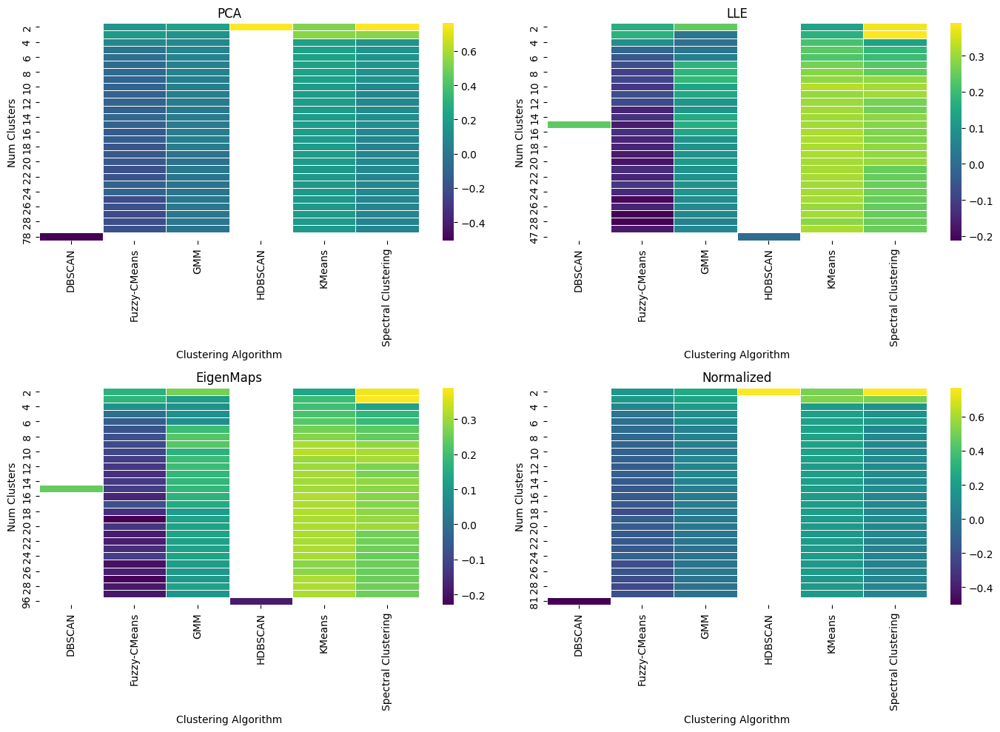

In [74]:
scores_per_clusters = {"PCA": {}, "LLE": {}, "EigenMaps":{}, "Normalized": {}}

if dbscan_num_clusters_pca != hdbscan_num_clusters_pca:
    scores_per_clusters["PCA"][dbscan_num_clusters_pca] = {"DBSCAN": dbscan_silhouette_pca}
    scores_per_clusters["PCA"][hdbscan_num_clusters_pca] = {"HDBSCAN": hdbscan_silhouette_pca}
else:
    scores_per_clusters["PCA"][dbscan_num_clusters_pca] = {"DBSCAN": dbscan_silhouette_pca, "HDBSCAN": hdbscan_silhouette_pca}
    
if dbscan_num_clusters_lle != hdbscan_num_clusters_lle:
    scores_per_clusters["LLE"][dbscan_num_clusters_lle] = {"DBSCAN": dbscan_silhouette_lle}
    scores_per_clusters["LLE"][hdbscan_num_clusters_lle] = {"HDBSCAN": hdbscan_silhouette_lle}
else:
    scores_per_clusters["LLE"][dbscan_num_clusters_ll] = {"DBSCAN": dbscan_silhouette_lle, "HDBSCAN": hdbscan_silhouette_lle}

if dbscan_num_clusters_eigen != hdbscan_num_clusters_eigen:
    scores_per_clusters["EigenMaps"][dbscan_num_clusters_eigen] = {"DBSCAN": dbscan_silhouette_eigen}
    scores_per_clusters["EigenMaps"][hdbscan_num_clusters_eigen] = {"HDBSCAN": hdbscan_silhouette_eigen}
else:
    scores_per_clusters["EigenMaps"][dbscan_num_clusters_eigen] = {"DBSCAN": dbscan_silhouette_eigen, "HDBSCAN": hdbscan_silhouette_eigen}

if dbscan_num_clusters != hdbscan_num_clusters:
    scores_per_clusters["Normalized"][dbscan_num_clusters] = {"DBSCAN": dbscan_silhouette}
    scores_per_clusters["Normalized"][hdbscan_num_clusters] = {"HDBSCAN": hdbscan_silhouette}
else:
    scores_per_clusters["Normalized"][dbscan_num_clusters] = {"DBSCAN": dbscan_silhouette, "HDBSCAN": hdbscan_silhouette}


for i in range(2, 30):
    if i not in scores_per_clusters["PCA"].keys():
        scores_per_clusters["PCA"][i] = {}
    scores_per_clusters["PCA"][i]["KMeans"] = kmeans_results_pca[i]["score"]
    scores_per_clusters["PCA"][i]["GMM"] = gmm_results_pca[i]["score"]
    scores_per_clusters["PCA"][i]["Spectral Clustering"] = spec_results_pca[i]["score"]
    scores_per_clusters["PCA"][i]["Fuzzy-CMeans"] = fuzzy_results_pca[i]["score"]

    if i not in scores_per_clusters["LLE"].keys():
        scores_per_clusters["LLE"][i] = {}
    scores_per_clusters["LLE"][i]["KMeans"] = kmeans_results_lle[i]["score"]
    scores_per_clusters["LLE"][i]["GMM"] = gmm_results_lle[i]["score"]
    scores_per_clusters["LLE"][i]["Spectral Clustering"] = spec_results_lle[i]["score"]
    scores_per_clusters["LLE"][i]["Fuzzy-CMeans"] = fuzzy_results_lle[i]["score"]

    if i not in scores_per_clusters["EigenMaps"].keys():
        scores_per_clusters["EigenMaps"][i] = {}
    scores_per_clusters["EigenMaps"][i]["KMeans"] = kmeans_results_eigen[i]["score"]
    scores_per_clusters["EigenMaps"][i]["GMM"] = gmm_results_eigen[i]["score"]
    scores_per_clusters["EigenMaps"][i]["Spectral Clustering"] = spec_results_eigen[i]["score"]
    scores_per_clusters["EigenMaps"][i]["Fuzzy-CMeans"] = fuzzy_results_eigen[i]["score"]

    if i not in scores_per_clusters["Normalized"].keys():
        scores_per_clusters["Normalized"][i] = {}
    scores_per_clusters["Normalized"][i]["KMeans"] = kmeans_results[i]["score"]
    scores_per_clusters["Normalized"][i]["GMM"] = gmm_results[i]["score"]
    scores_per_clusters["Normalized"][i]["Spectral Clustering"] = spec_results[i]["score"]
    scores_per_clusters["Normalized"][i]["Fuzzy-CMeans"] = fuzzy_results[i]["score"]

plot_all_heatmaps(scores_per_clusters)